In [2]:
import xarray as xr
import rioxarray
import holoviews as hv
import hvplot.xarray
import hvplot.dask 

hvplot.extension('matplotlib')
import matplotlib.pyplot as plt
from pathlib import Path
import scipy
import scipy.ndimage.filters as filters
from scipy import ndimage
from dask.distributed import Client
import dask
import seaborn as sb
import numpy as np
import pandas as pd
import geopandas as gp
from shapely.geometry import Point
import pyproj

from pathlib import Path

In [3]:
client = Client()

In [4]:
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 3
Total threads: 6,Total memory: 32.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:63479,Workers: 3
Dashboard: http://127.0.0.1:8787/status,Total threads: 6
Started: Just now,Total memory: 32.00 GiB
Comm: tcp://127.0.0.1:63491,Total threads: 2
Dashboard: http://127.0.0.1:63494/status,Memory: 10.67 GiB
Nanny: tcp://127.0.0.1:63484,


---

### Prototyping code goes here - not used to produce final output

In [28]:
testfile = Path("/Volumes/FIREICE/fihyper/cwaigl/20200830_BC/03_products/cropped_masked_final/20200830-BC_05_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq")

After testing, we don't need `rioxarray` to deal with this data. But we keep the library call in the back pocket. 

In [29]:
#testdata_forcrs = rioxarray.open_rasterio(testfile, chunks=(-1, 256, 256), default_name="reflectance", variable='reflectance')
testdata = xr.open_dataset(testfile, engine="rasterio", chunks={'band': 1, 'x': 200, 'y': 400})
testdata

<xarray.Dataset>
Dimensions:      (band: 459, x: 1254, y: 8506)
Coordinates:
    fwhm         (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    wavelength   (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
  * band         (band) int64 1 2 3 4 5 6 7 8 ... 453 454 455 456 457 458 459
  * x            (x) float64 4.374e+05 4.374e+05 ... 4.387e+05 4.387e+05
  * y            (y) float64 7.183e+06 7.183e+06 ... 7.175e+06 7.175e+06
    spatial_ref  int64 ...
Data variables:
    band_data    (band, y, x) float32 dask.array<chunksize=(1, 400, 200), meta=np.ndarray>

In [31]:
testdata.rio.crs

CRS.from_epsg(32606)

In [32]:
testdata.attrs['long_name'] = "spectral reflectance, %*100"
testdata.attrs['name'] = "spectral reflectance, %*100"
testdata['band_data'].attrs['long_name']  =  "spectral reflectance, %*100"

In [33]:
testdata.band_data

<xarray.DataArray 'band_data' (band: 459, y: 8506, x: 1254)>
dask.array<open_dataset-bb850d5d09e0853b06639fe522377844band_data, shape=(459, 8506, 1254), dtype=float32, chunksize=(1, 400, 200), chunktype=numpy.ndarray>
Coordinates:
    fwhm         (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    wavelength   (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
  * band         (band) int64 1 2 3 4 5 6 7 8 ... 453 454 455 456 457 458 459
  * x            (x) float64 4.374e+05 4.374e+05 ... 4.387e+05 4.387e+05
  * y            (y) float64 7.183e+06 7.183e+06 ... 7.175e+06 7.175e+06
    spatial_ref  int64 ...
Attributes:
    wavelength:                410.36
    wavelength_units:          nm
    long_name:                 spectral reflectance, %*100
    acquisition_time:          2020-08-30T23:23:19.0Z
    bands:                     459
    band_names:                band   1, band   2, band   3, band   4, band  ...
    byte_order:                0
    coordinate_system_string:  PROJCS["WGS_1984_UTM_Zone_6N",GEOGCS["GCS_WGS_...
    data_ignore_value:         14000
    data_type:                 2
    default_bands:             291.000000, 141.000000, 20.000000
    file_type:                 ENVI Standard
    header_offset:             0
    interleave:                bsq
    lines:                     8506
    map_info:                  UTM, 1, 1, 437403.5, 7183053.5, 1, 1, 6, North...
    reflectance_scale_factor:  10000
    samples:                   1254
    sun_azimuth:               206.35
    sun_elevation:             31.22
    z_plot_range:              0, 10000
    z_plot_titles:              wavelength [nm], reflectance [%*100]

The CRS is used to create a transform to translate lat/lon into UTM 6N coordinates

In [34]:
testdata.y

<xarray.DataArray 'y' (y: 8506)>
array([7183053., 7183052., 7183051., ..., 7174550., 7174549., 7174548.])
Coordinates:
  * y            (y) float64 7.183e+06 7.183e+06 ... 7.175e+06 7.175e+06
    spatial_ref  int64 ...

In [35]:
testdata.band_data.attrs['coordinate_system_string']

'PROJCS["WGS_1984_UTM_Zone_6N",GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137.0,298.257223563]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["False_Easting",500000.0],PARAMETER["False_Northing",0.0],PARAMETER["Central_Meridian",-147.0],PARAMETER["Scale_Factor",0.9996],PARAMETER["Latitude_Of_Origin",0.0],UNIT["Meter",1.0]]'

In [36]:
testdata.band_data.attrs['map_info'].split(',')

['UTM',
 ' 1',
 ' 1',
 ' 437403.5',
 ' 7183053.5',
 ' 1',
 ' 1',
 ' 6',
 ' North',
 'WGS-84']

In [37]:
crs = pyproj.CRS.from_wkt(testdata.band_data.attrs['coordinate_system_string'])
transformer = pyproj.Transformer.from_crs(pyproj.CRS.from_epsg(4326), crs, always_xy=True) 
lonlat_to_crs = lambda lon, lat: transformer.transform(lon, lat)    

let's get band 150

In [38]:
selectionarray = testdata.band_data.sel(band=137).to_masked_array(copy=False)
selectionarray.shape

(8506, 1254)

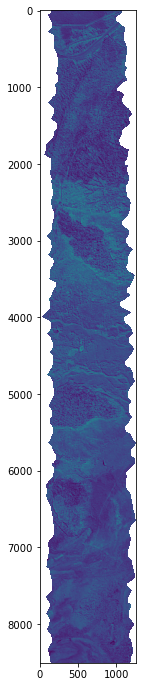

In [173]:
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
ax.imshow(selectionarray, cmap="viridis")
ax.set_aspect('equal')

In [39]:
rstart = 6500
rdelta = 500
cstart = 300
cdelta = 500

In [40]:
subset = selectionarray[rstart:rstart+rdelta,cstart:cstart+cdelta]
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
ax.imshow(subset, cmap="gray")
ax.set_aspect('equal')


In [41]:
neighborhood_size_max = 5
neighborhood_size_min = 5
threshold = 800

data = subset

data_max = ndimage.maximum_filter(data, neighborhood_size_max)
maxima = (data == data_max)
#maxima = np.where(data > 2000, maxima, False)
data_min = ndimage.minimum_filter(data, neighborhood_size_min)
diff = ((data_max - data_min) > threshold)
maxima[diff == 0] = 0

labeled, num_objects = ndimage.label(maxima)
slices = ndimage.find_objects(labeled)
x, y = [], []
for dy, dx in slices:
    x_center = (dx.start + dx.stop - 1)/2
    x.append(x_center)
    y_center = (dy.start + dy.stop - 1)/2    
    y.append(y_center)

In [42]:
len(x)

5571

In [43]:
maxima.sum()

5575

In [44]:
np.nonzero(maxima)

(array([  0,   0,   0, ..., 499, 499, 499]),
 array([  1,   5,  19, ..., 443, 447, 482]))

In [45]:
maxima = np.ma.masked_array(maxima, mask=subset.mask)
labeled = np.ma.masked_array(labeled, mask=subset.mask)

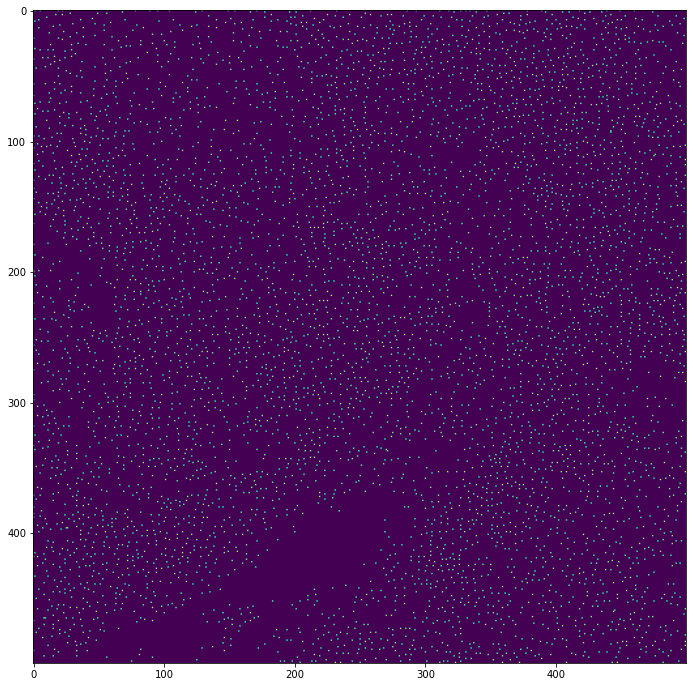

In [181]:
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
ax.imshow(maxima)
ax.set_aspect('equal')

In [46]:
kde = ndimage.gaussian_filter(maxima.astype(np.float32), sigma=10, mode="reflect")

In [47]:
m_kde = np.ma.masked_array(kde, mask=subset.mask)

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
ax.imshow(m_kde)
ax.scatter(x, y, marker='.', color='r')
ax.set_aspect('equal')

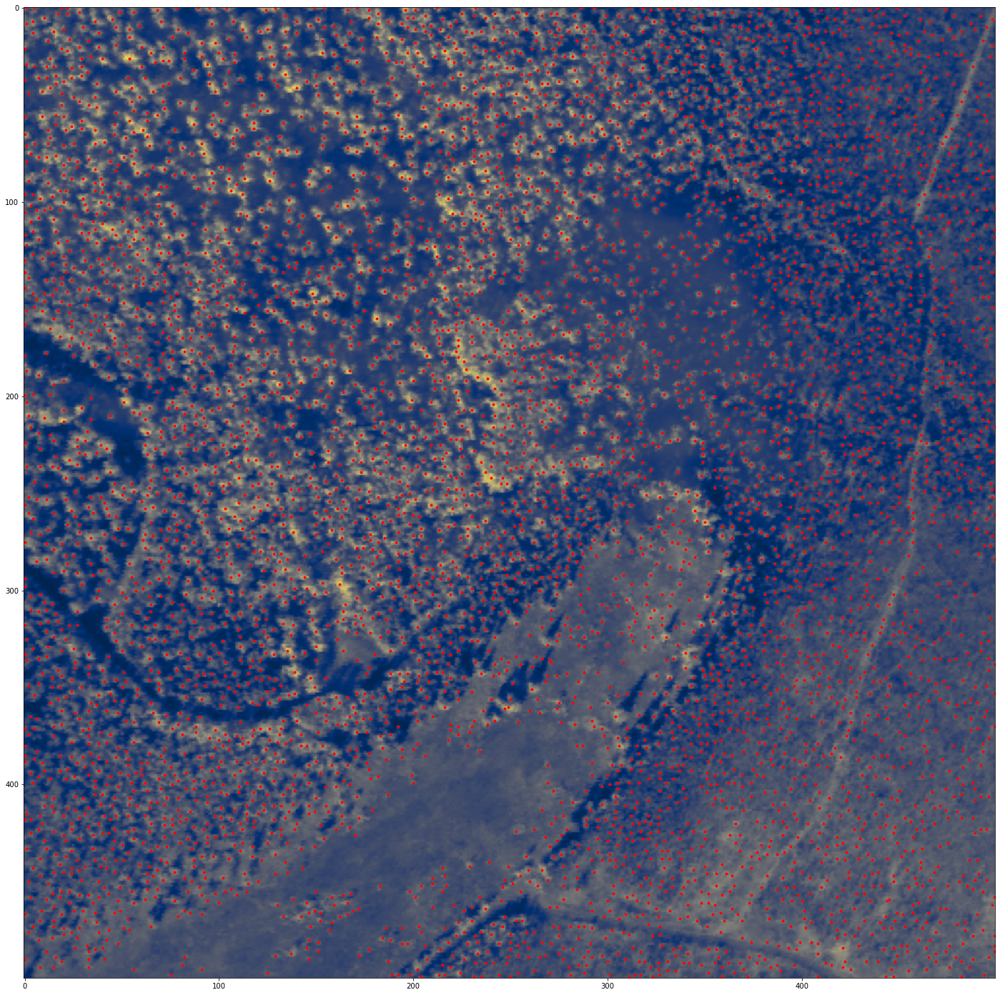

In [185]:
fig, ax = plt.subplots(1, 1, figsize=(25, 25))
ax.imshow(subset, cmap="cividis")
ax.scatter(x, y, marker='.', color='r')
ax.set_aspect('equal')

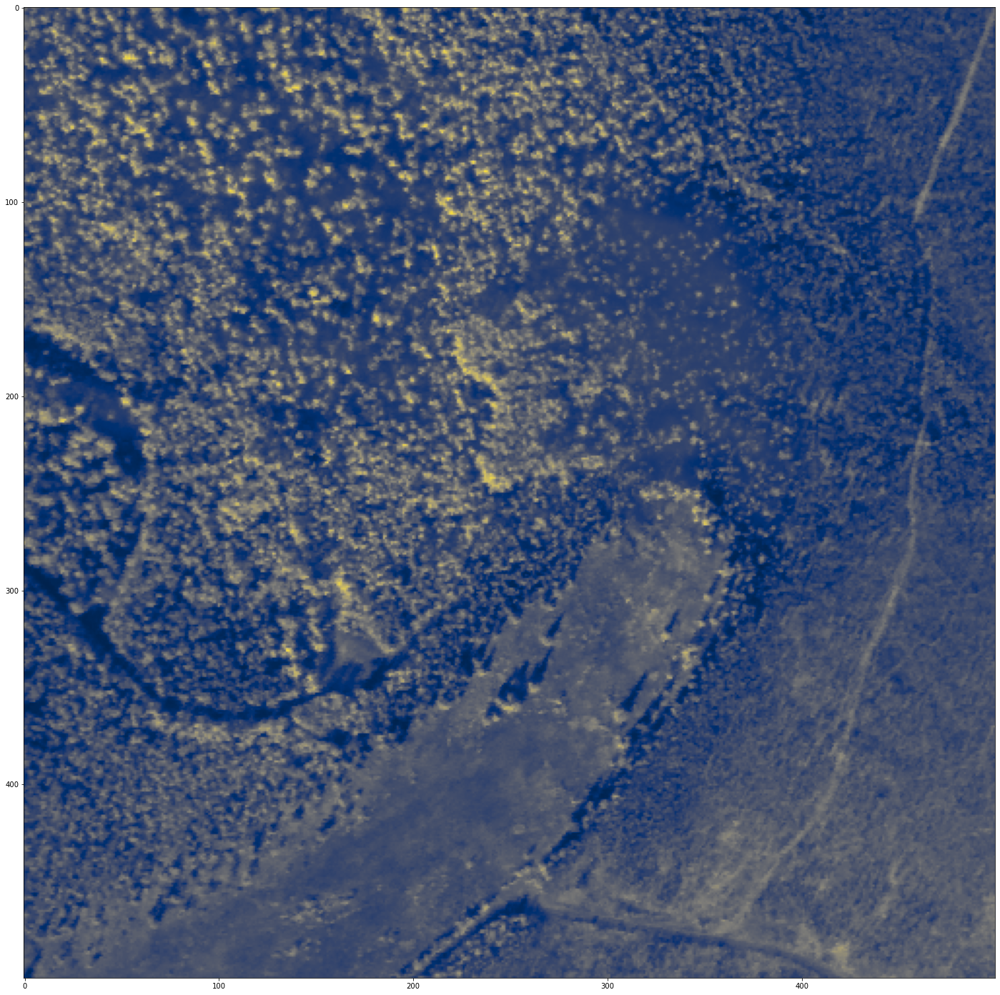

In [186]:
fig, ax = plt.subplots(1, 1, figsize=(25, 25))
ax.imshow(subset, cmap="cividis")
ax.set_aspect('equal')

In [55]:
subset

masked_array(
  data=[[2613.0, 3189.0, 2286.0, ..., 1454.0, 1794.0, 2290.0],
        [3084.0, 2453.0, 1834.0, ..., 1460.0, 2044.0, 2670.0],
        [2003.0, 1539.0, 1598.0, ..., 1641.0, 2106.0, 2701.0],
        ...,
        [1337.0, 567.0, 406.0, ..., 1931.0, 2242.0, 2072.0],
        [901.0, 508.0, 565.0, ..., 1931.0, 1939.0, 1997.0],
        [694.0, 646.0, 479.0, ..., 2613.0, 2566.0, 2575.0]],
  mask=[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],
  fill_value=1e+20,
  dtype=float32)

In [58]:
subDS = testdata.isel(x=slice(cstart, cstart+cdelta), y=slice(rstart, rstart+rdelta))
subDS.rio.transform()

Affine(1.0, 0.0, 437703.5,
       0.0, -1.0, 7176553.5)

In [ ]:
kde_DS = xr.Dataset({
    'crowndensity': (['x', 'y'], subset)},
    co

In [187]:
testdata.band_data.sel(band=[291, 141, 20])

<xarray.DataArray 'band_data' (band: 3, y: 8506, x: 1254)>
dask.array<getitem, shape=(3, 8506, 1254), dtype=float32, chunksize=(1, 400, 200), chunktype=numpy.ndarray>
Coordinates:
    fwhm         (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    wavelength   (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
  * band         (band) int64 291 141 20
  * x            (x) float64 4.374e+05 4.374e+05 ... 4.387e+05 4.387e+05
  * y            (y) float64 7.183e+06 7.183e+06 ... 7.175e+06 7.175e+06
    spatial_ref  int64 ...
Attributes:
    wavelength:                410.36
    wavelength_units:          nm
    long_name:                 spectral reflectance, %*100
    acquisition_time:          2020-08-30T23:23:19.0Z
    bands:                     459
    band_names:                band   1, band   2, band   3, band   4, band  ...
    byte_order:                0
    coordinate_system_string:  PROJCS["WGS_1984_UTM_Zone_6N",GEOGCS["GCS_WGS_...
    data_ignore_value:         14000
    data_type:                 2
    default_bands:             291.000000, 141.000000, 20.000000
    file_type:                 ENVI Standard
    header_offset:             0
    interleave:                bsq
    lines:                     8506
    map_info:                  UTM, 1, 1, 437403.5, 7183053.5, 1, 1, 6, North...
    reflectance_scale_factor:  10000
    samples:                   1254
    sun_azimuth:               206.35
    sun_elevation:             31.22
    z_plot_range:              0, 10000
    z_plot_titles:              wavelength [nm], reflectance [%*100]

In [192]:
x_proj = np.array(x) + cstart + 437403.5
y_proj = 7183053.5 - rstart - np.array(y) 

#x_proj = np.array(x) + 437403.5
#y_proj = 7183053.5 - np.array(y) 

In [193]:
testdata.band_data[:, rstart:rstart+rdelta,cstart:cstart+cdelta].sel(band=[291, 141, 20])

<xarray.DataArray 'band_data' (band: 3, y: 500, x: 500)>
dask.array<getitem, shape=(3, 500, 500), dtype=float32, chunksize=(1, 300, 200), chunktype=numpy.ndarray>
Coordinates:
    fwhm         (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    wavelength   (band) float64 dask.array<chunksize=(1,), meta=np.ndarray>
  * band         (band) int64 291 141 20
  * x            (x) float64 4.377e+05 4.377e+05 ... 4.382e+05 4.382e+05
  * y            (y) float64 7.177e+06 7.177e+06 ... 7.176e+06 7.176e+06
    spatial_ref  int64 ...
Attributes:
    wavelength:                410.36
    wavelength_units:          nm
    long_name:                 spectral reflectance, %*100
    acquisition_time:          2020-08-30T23:23:19.0Z
    bands:                     459
    band_names:                band   1, band   2, band   3, band   4, band  ...
    byte_order:                0
    coordinate_system_string:  PROJCS["WGS_1984_UTM_Zone_6N",GEOGCS["GCS_WGS_...
    data_ignore_value:         14000
    data_type:                 2
    default_bands:             291.000000, 141.000000, 20.000000
    file_type:                 ENVI Standard
    header_offset:             0
    interleave:                bsq
    lines:                     8506
    map_info:                  UTM, 1, 1, 437403.5, 7183053.5, 1, 1, 6, North...
    reflectance_scale_factor:  10000
    samples:                   1254
    sun_azimuth:               206.35
    sun_elevation:             31.22
    z_plot_range:              0, 10000
    z_plot_titles:              wavelength [nm], reflectance [%*100]

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
testdata.band_data[:, rstart:rstart+rdelta,cstart:cstart+cdelta].sel(band=[75, 45, 10]).plot.imshow(rgb="band", robust=True, )
ax.scatter(x_proj, y_proj, marker='.', color='magenta')
ax.set_aspect('equal') 

In [133]:
pts = list(map(Point, zip(x_proj+0.5, y_proj-0.5)))

In [201]:
pd.DataFrame(data={'rowidx': np.array(x).astype('int') , 'colidx': np.array(np.array(x).astype('int')).astype('int')})

,rowidx,colidx
0,1,1
1,5,5
2,19,19
3,22,22
4,78,78
...,...,...
5566,372,372
5567,408,408
5568,443,443
5569,447,447


In [134]:
crowns = gp.GeoDataFrame({'geometry': pts}, crs=crs)
crowns

,geometry
0,POINT (437709.000 7176553.000)
1,POINT (437723.000 7176553.000)
2,POINT (437726.000 7176553.000)
3,POINT (437782.000 7176553.000)
4,POINT (437793.000 7176553.000)
...,...
5659,POINT (438111.000 7176054.000)
5660,POINT (438147.000 7176054.000)
5661,POINT (438151.000 7176054.000)
5662,POINT (438186.000 7176054.000)


In [100]:
crowns.to_file("../data/interim/crowns_mid.gpkg") 

/Users/christine/miniconda3/envs/python38_geo/lib/python3.8/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


----

### Looping through directories for BC

In [5]:
datadirs = [
    Path("/Volumes/FIREICE/fihyper/cwaigl/20200830_BC/03_products/cropped_masked_final/"),
    Path("/Volumes/FIREICE/fihyper/cwaigl/20210803_BC/03_products/cropped_masked_final/") 
]
prefixs = ['20200830-BC', '20210803-BC']
filepatt = f"VNIR_SWIR_rad_geo_atm_bcor_crop.bsq"
outdir = Path("/Volumes/FIREICE/fiboreal/cwaigl/2021-HySpex_fuels/HySpex_data_extracted/")


In [6]:
def find_maxima(dataarray, neighborhood_size_max=5, neighborhood_size_min=5):
    """find relative local maxima """
    data_max = ndimage.maximum_filter(selectionarray, neighborhood_size_max)
    maxima = (selectionarray == data_max)
    data_min = ndimage.minimum_filter(selectionarray, neighborhood_size_min)
    diff = ((data_max - data_min) > threshold)
    maxima[diff == 0] = 0
    return maxima

def maxmima_to_arrayrowcol(maxima):
    """find individual crown locations in raster coordinates"""
    labeled, num_objects = ndimage.label(maxima)
    slices = ndimage.find_objects(labeled)
    x, y = [], []
    for dy, dx in slices:
        x_center = (dx.start + dx.stop - 1)/2
        x.append(x_center)
        y_center = (dy.start + dy.stop - 1)/2    
        y.append(y_center)
    return np.array(x), np.array(y)

def xy_to_df(x, y, prefix=None, lineno=None):
    """return dataframe of x, y coordinates with additional metadata columns"""
    idxdf = pd.DataFrame(data={'rowidx': np.array(x).astype('int') , 'colidx': np.array(y).astype('int')})
    if prefix: idxdf['prefix'] = prefix
    if lineno: idxdf['linenumber'] = lineno
    return idxdf

def xy_to_mapcoord(x, y, hyspexds):
    """translate x, y to projected map coordinates"""
    crs = pyproj.CRS.from_wkt(hyspexds.band_data.attrs['coordinate_system_string'])
    trans_components = [string.strip() for string in hyspexds.band_data.attrs['map_info'].split(',')]
    xstart = int((float(trans_components[3]) + 0.5))
    ystart = int((float(trans_components[4]) - 0.5))
    x_proj = np.array(x) + xstart
    y_proj = ystart - np.array(y) 
    return x_proj, y_proj

In [9]:
testband = 137   # 840 nm, non-interpolated, from VNIR camera
neighborhood_size_max = 5
neighborhood_size_min = 5
threshold = 800
outdfs = []

for datadir, prefix in zip(datadirs, prefixs):
    files = sorted(list(datadir.glob(f'{prefix}*{filepatt}')))
    for fpth in files: 
        print(f"working on {fpth.name}") 
        lineno = fpth.name[len(prefix)+1:len(prefix)+3]
        with xr.open_dataset(fpth, engine="rasterio", chunks={'band': 1, 'x': 200, 'y': 400}) as data:
            selectionarray = data.band_data.sel(band=testband).to_masked_array(copy=False)
            crs = data.rio.crs
            # find relative local maxima 
            maxima = find_maxima(selectionarray)
            # find individual crown locations in raster coordinates
            x, y = maxmima_to_arrayrowcol(maxima)
            # save dataframe for coordinates
            idxdf = xy_to_df(x, y, prefix=prefix, lineno=lineno)
            outdfs.append(idxdf.copy())
            # translate and save for projected coordinates 
            x_proj, y_proj = xy_to_mapcoord(x, y, data)
            pts = list(map(Point, zip(x_proj, y_proj)))
            crowns = gp.GeoDataFrame({
                'raster_x': x,
                'raster_y': y,
                'geometry': pts,}, crs=crs)
            crowns['prefix'] = prefix
            crowns['lineno'] = lineno
            crowns['filename'] = fpth.name
            crowns.to_file(outdir / "crowns_BC_all.gpkg", layer=f"{prefix}_{lineno}", driver='GPKG') 

working on 20200830-BC_01_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20200830-BC_02_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20200830-BC_03_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20200830-BC_04_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20200830-BC_05_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20200830-BC_06_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20200830-BC_07_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_01_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_02_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_03_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_04_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_05_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_06_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
working on 20210803-BC_07_VNIR_SWIR_rad_geo_atm_bcor_crop.bsq
